# Setting up the notebook

We begin by setting up the Jupyter notebook and importing the Python modules needed for plotting figures, create animations, etc. We include commands to view plots in the Jupyter notebook, and to create figures with good resolution and large labels. These commands can be customized to produce figures with other specifications.

In [1]:
# Imports python libraries
import numpy as np
import random as rd
import wave
import sys
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
sys.path.insert(1, r'./../functions') # add to pythonpath

#For creating animations and plotting in 3D
from matplotlib import rc
import matplotlib.animation as animation
from JSAnimation import IPython_display
from mpl_toolkits.mplot3d import Axes3D


# commands to create high-resolution figures with large labels
%config InlineBackend.figure_formats = {'png', 'retina'} 
plt.rcParams['axes.labelsize'] = 18 # fontsize for figure labels
plt.rcParams['axes.titlesize'] = 20 # fontsize for figure titles
plt.rcParams['font.size'] = 16 # fontsize for figure numbers
plt.rcParams['lines.linewidth'] = 1.6 # line width for plotting

In [2]:
#Function that extracts the number of recording channels, sampling rate, time and signal
#variable is the path and filename of the .wav file
def ecg(variable):
    record = wave.open(variable, 'r') # load the data

    # Get the number of channels, sample rate, etc.
    numChannels = record.getnchannels() #number of channels
    numFrames = record.getnframes() #number of frames
    sampleRate = record.getframerate() #sampling rate
    sampleWidth = record.getsampwidth()
    
    # Get wave data
    dstr = record.readframes(numFrames * numChannels)
    waveData = np.frombuffer(dstr, np.int16)

    # Get time window
    timeEMG = np.linspace(0, len(waveData)/sampleRate, num=len(waveData))

    return timeEMG, waveData

# Animations

In medicine, the duration of the QRS complex in a healthy heart is considered to be less than 12 ms [Szulewski, 2018]. Notice that when considering a time delay around this value, the attractor’s dynamic unfolds i.e., the cycle is clearly visible.

<img src="ecg_and_attractor.gif" width="750" align="center">

In [4]:
x, y = ecg("S1_rest.wav") #x is time and y is the voltage signal


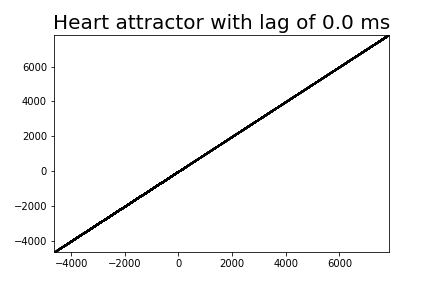
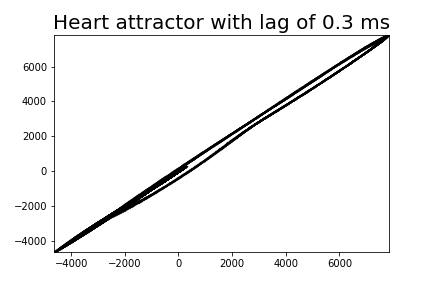
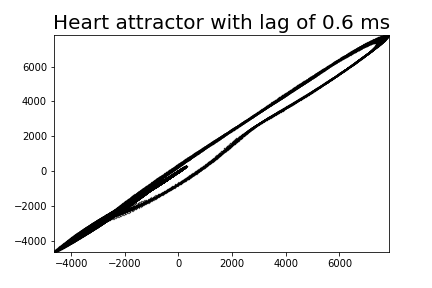
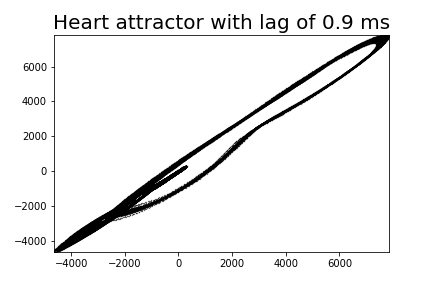
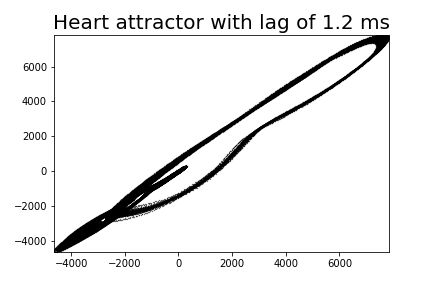
...
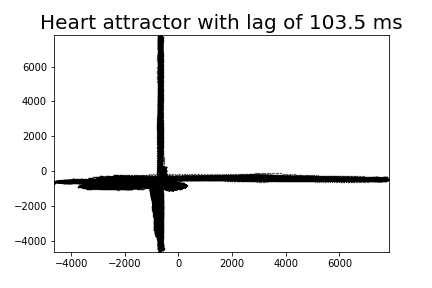
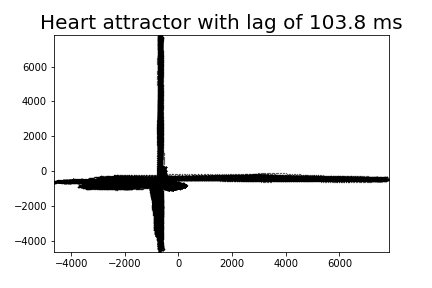
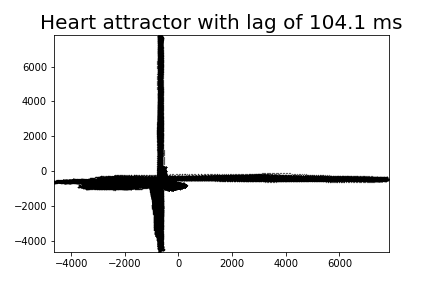
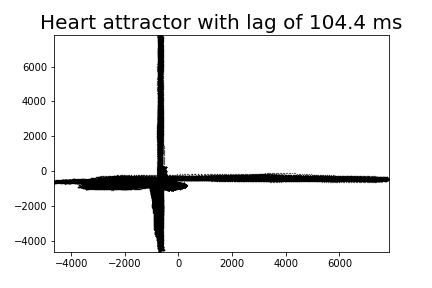
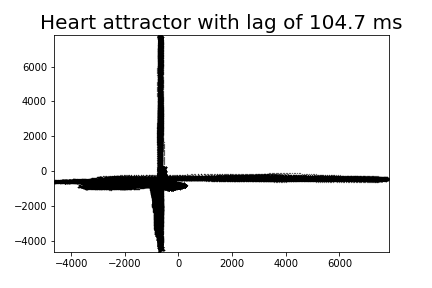

In [24]:
# Several 2D cuts of the attractor in an animation!

delay = 3
number_of_frames = 350
length = len(y)

fig,ax = plt.subplots() #Manejo de objetos
ax.set_xlim((min(y),max(y))),ax.set_ylim((min(y),max(y))) #A una variable le pegas una funcion

#trayectoria y bolita son apuntadores
trayectory, = ax.plot([],[],'k.', markersize = 0.5)

def initialize():
    trayectory.set_data([],[])
    return(trayectory,)

def animate(i):
    trayectory.set_data(y[delay*i:length], y[:length-delay*i])
    ax.set_title("Heart attractor with lag of "+str(round(delay*0.1*i, 2))+" ms")
    return(trayectory,)

animation.FuncAnimation(fig, animate, init_func=initialize,
                               frames=number_of_frames, interval=40, blit=True)

# anim.save('ecg_attractor_unfolding.gif', writer='pillow')